# ESDA: Study Catalan Spatial Data

Load libraries:

In [99]:
import pandas as pd
import geopandas as gpd
import pprint
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import logging
import pysal as ps
import contextily
from splot.esda import plot_moran
from pysal.viz import splot
from unidecode import unidecode
from pysal.explore import esda
from pysal.lib import weights
from numpy.random import seed

pp = pprint.PrettyPrinter(indent=2)

logging.basicConfig(
    level=logging.INFO,
    format="%(asctime)s - %(levelname)s - %(message)s",
    datefmt="%Y-%m-%d %H:%M:%S",
)

Load the dataset:

In [100]:

data = gpd.read_file("../../data/raw/bseccenv10sh1f1_20200101_2/bseccenv10sh1f1_20200101_2.shp")
data.head()

,MUNICIPI,DISTRICTE,SECCIO,MUNDISSEC,geometry
0,080018,01,001,08001801001,"POLYGON ((408792.512 4596753.053, 408797.803 4..."
1,080018,01,002,08001801002,"POLYGON ((408265.107 4597223.944, 408314.501 4..."
2,080018,01,003,08001801003,"POLYGON ((409117.362 4598172.550, 409152.489 4..."
3,080018,01,004,08001801004,"POLYGON ((408670.544 4598076.591, 408718.938 4..."
4,080018,01,005,08001801005,"POLYGON ((408075.992 4597102.922, 408093.732 4..."


In [101]:
data.shape

(5073, 5)

In [102]:
print("Number of unique values in each column:")
pp.pprint(data.nunique())

Number of unique values in each column:
MUNICIPI      947
DISTRICTE      10
SECCIO        181
MUNDISSEC    5073
geometry     5073
dtype: int64


<Axes: >

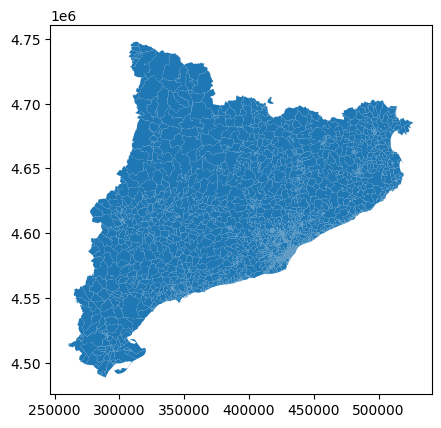

In [103]:
data.plot()

In [104]:
# Access the geometry (shape) data
geometry = data.geometry
geometry.head()

0    POLYGON ((408792.512 4596753.053, 408797.803 4...
1    POLYGON ((408265.107 4597223.944, 408314.501 4...
2    POLYGON ((409117.362 4598172.550, 409152.489 4...
3    POLYGON ((408670.544 4598076.591, 408718.938 4...
4    POLYGON ((408075.992 4597102.922, 408093.732 4...
Name: geometry, dtype: geometry

In [105]:
# Check data type of a value in the geometry column
type(data["geometry"].values[0])

shapely.geometry.polygon.Polygon

In [106]:
# Calculate the area of each electoral section
data.geometry.area

0       9.138874e+05
1       1.268568e+05
2       2.567497e+06
3       6.637321e+06
4       1.012406e+05
            ...     
5068    3.287654e+07
5069    6.456974e+05
5070    2.945703e+05
5071    1.990085e+06
5072    4.422443e+06
Length: 5073, dtype: float64

In [107]:
# Get area and convert from m2 to km2
data["area_km2"] = data.area / 1000000

In [108]:
data["area_km2"].head()

0    0.913887
1    0.126857
2    2.567497
3    6.637321
4    0.101241
Name: area_km2, dtype: float64

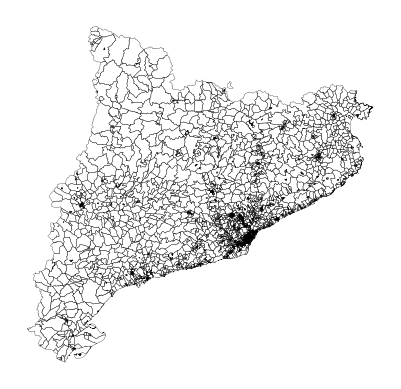

In [109]:
data.plot(facecolor="none", linewidth=0.2)

plt.axis("off")
plt.show()

In [110]:
data.crs.name

'ETRS89 / UTM zone 31N'

In [111]:
data["geometry"].centroid.head()

0    POINT (408669.930 4596032.589)
1    POINT (408290.793 4597078.297)
2    POINT (409290.729 4596322.183)
3    POINT (406672.959 4596513.089)
4    POINT (408190.161 4596794.131)
dtype: geometry

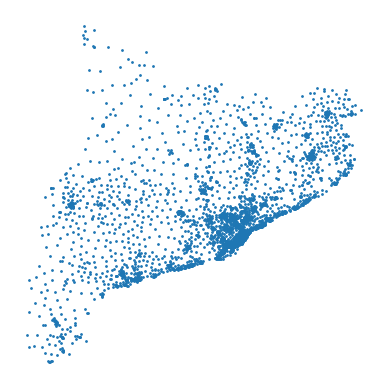

In [112]:
data.centroid.plot(markersize=1)

plt.axis("off")
plt.show()

In [113]:
data.unary_union

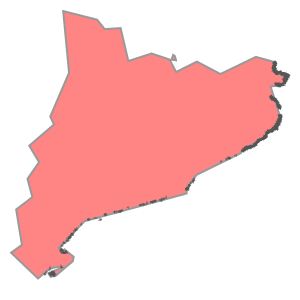

In [114]:
data.unary_union.simplify(tolerance=5000)

In [115]:
# Create a new column and add a constant value
data["big"] = 0

In [116]:
# Filter rows with above average pop density and update the column dense
data.loc[data["area_km2"] > data["area_km2"].mean(), "big"] = 1

In [117]:
# Check number of rows per category
data.big.value_counts()

big
0    4128
1     945
Name: count, dtype: int64

In [118]:
# Conduct the aggregation
dissolved = data[[ "area_km2", "big", "geometry"]].dissolve(
    by="big", aggfunc="sum"
)

In [119]:
dissolved

,geometry,area_km2
big,,
0,"MULTIPOLYGON (((286576.182 4490325.727, 286509...",2102.259989
1,"MULTIPOLYGON (((292359.157 4500863.921, 292370...",30003.175585


In [120]:
dissolved = dissolved.reset_index()

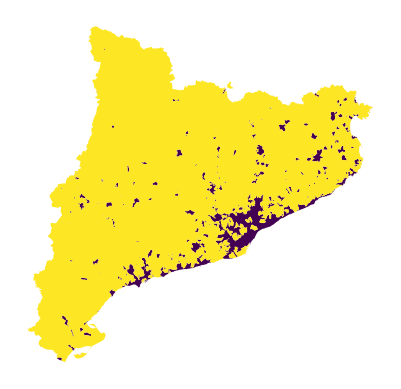

In [121]:
dissolved.plot(column="big")

plt.axis("off")
plt.show()

## Add more variables

Let's add more variables using voting data from the last Catalan election.

In [122]:
df = pd.read_pickle('../../data/processed/catalan-elections-clean-data.pkl')

In [123]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4146043 entries, 0 to 4146042
Data columns (total 33 columns):
 #   Column                     Dtype         
---  ------                     -----         
 0   index_autonumeric          Int64         
 1   id_eleccio                 string        
 2   nom_eleccio                string        
 3   id_nivell_territorial      string        
 4   nom_nivell_territorial     string        
 5   territori_codi             string        
 6   territori_nom              string        
 7   seccio                     float64       
 8   vots                       int32         
 9   escons                     Int64         
 10  districte                  float64       
 11  mesa                       string        
 12  type                       string        
 13  year                       int32         
 14  round                      string        
 15  party_code                 int32         
 16  party_name                 object   

Our spatial dataset `data` uses the `MUNDISSEC` to indentify the electoral sections. We need to seek for the corresponding variable on the electoral results `df` dataset.

In [124]:
data.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 5073 entries, 0 to 5072
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   MUNICIPI   5073 non-null   object  
 1   DISTRICTE  5073 non-null   object  
 2   SECCIO     5073 non-null   object  
 3   MUNDISSEC  5073 non-null   object  
 4   geometry   5073 non-null   geometry
 5   area_km2   5073 non-null   float64 
 6   big        5073 non-null   int64   
dtypes: float64(1), geometry(1), int64(1), object(4)
memory usage: 277.6+ KB


In [125]:
df[(df["territori_codi"] == "25183") & (df["id_nivell_territorial"] == "SE")][
    ["nom_eleccio", "nom_nivell_territorial", "territori_nom", "territori_codi", "districte", "seccio"]
].drop_duplicates()

,nom_eleccio,nom_nivell_territorial,territori_nom,territori_codi,districte,seccio
47984,Eleccions al Parlament de Catalunya 1980,Secció,Rialp,25183,1.0,1.0
116428,Eleccions al Parlament de Catalunya 1984,Secció,Rialp,25183,1.0,1.0
226679,Eleccions al Parlament de Catalunya 1988,Secció,Rialp,25183,1.0,1.0
237469,Eleccions al Parlament Europeu 1987,Secció,Rialp,25183,1.0,1.0
315288,Eleccions al Parlament de Catalunya 1992,Secció,Rialp,25183,1.0,1.0
371044,Eleccions al Parlament de Catalunya 1995,Secció,Rialp,25183,1.0,1.0
450656,Eleccions al Parlament de Catalunya 1999,Secció,Rialp,25183,1.0,1.0
539244,Eleccions al Parlament de Catalunya 2003,Secció,Rialp,25183,1.0,1.0
626622,Eleccions al Parlament de Catalunya 2021,Secció,Rialp,25183,1.0,1.0
633916,Eleccions al Parlament de Catalunya 2006,Secció,Rialp,25183,1.0,1.0


After investigating what the ``MUNICIPI`` variable is, we can see that it is an arbitrary code for the municipality. We saw that its the rightmost digit is a check digit, so we can remove it and use the rest of the code to merge the datasets. 

In [126]:
data["municipality_code"] = data["MUNICIPI"].astype("string").str.slice(start=0, stop=-1).str.lstrip("0")
data["municipality_code"].head()

0    8001
1    8001
2    8001
3    8001
4    8001
Name: municipality_code, dtype: string

Also, the ``MUNDISSEC`` variable is a combination of the ``MUNICIPI``, the district code and the ``SECCIO`` code. We can divide the ``MUNDISSEC`` variable into new variables: ``district_code`` and ``section_code``.

In [127]:
data["district_code"] = data["MUNDISSEC"].str.slice(start=6, stop=8).astype(int)
data["section_code"] = data["SECCIO"].astype(int)
print(data[["MUNDISSEC", "municipality_code", "district_code", "section_code"]].head())

     MUNDISSEC municipality_code  district_code  section_code
0  08001801001              8001              1             1
1  08001801002              8001              1             2
2  08001801003              8001              1             3
3  08001801004              8001              1             4
4  08001801005              8001              1             5


Now, we are ready to merge both datasets:

In [128]:
# Filter 'df' to only include rows with "id_nivell_territorial" == "SE" and filter to only include the most recent year
df_filtered = df[
    (df["id_nivell_territorial"] == "SE") & (df["year"] == df["year"].max())
].copy()
df_filtered["territori_codi"] = (
    df_filtered["territori_codi"].astype("string").str.lstrip("0")
)

# Merge 'data' with 'df_filtered' based on specified columns
merged_data = data.merge(
    df_filtered,
    left_on=["municipality_code", "district_code", "section_code"],
    right_on=["territori_codi", "districte", "seccio"],
    how="inner",
)

In [129]:
noms_codis = df_filtered[["territori_codi", "territori_nom"]].drop_duplicates()

In [130]:
muni_codis_data = data[['MUNICIPI', 'municipality_code']].drop_duplicates()

After merging the datasets, we now have a row for each party result on every censal section. This isn't the desired format, so we need to aggregate the data by censal section.

We will group by the ``MUNDISSEC`` variable and sum the votes. 

In [131]:
party_colors = df[df["year"] == df["year"].max()][
    ["party_abbr", "party_color"]
].drop_duplicates()

In [132]:
aggregated_data = (
    merged_data.groupby("MUNDISSEC")
    .agg(
        {
            "vots": "sum",  # Sum votes
            "geometry": "first",  # Keep the first geometry
        }
    )
    .reset_index()
)


def most_voted_party(series):
    return series.idxmax()


# Additionally, group by both 'MUNDISSEC' and 'party_abbr' to sum votes for each party within each section
votes_by_party = (
    merged_data.groupby(["MUNDISSEC", "party_abbr"])["vots"].sum().reset_index()
)


# Now, find the party with the most votes per 'MUNDISSEC'
votes_by_party["rank"] = votes_by_party.groupby("MUNDISSEC")["vots"].rank(
    method="first", ascending=False
)


most_voted_party_per_section = votes_by_party[votes_by_party["rank"] == 1]


# Merge this information back into 'aggregated_data'
final_aggregated_data = aggregated_data.merge(
    most_voted_party_per_section[["MUNDISSEC", "party_abbr"]],
    on="MUNDISSEC",
    how="left",
)

final_aggregated_data = final_aggregated_data.merge(party_colors, on="party_abbr", how="left")


# Convert the final aggregated DataFrame back into a GeoDataFrame
final_aggregated_geo = gpd.GeoDataFrame(final_aggregated_data, geometry="geometry")


final_aggregated_geo

,MUNDISSEC,vots,geometry,party_abbr,party_color
0,08001801001,607,"POLYGON ((408792.512 4596753.053, 408797.803 4...",PSC,#E10819
1,08001801002,653,"POLYGON ((408265.107 4597223.944, 408314.501 4...",PSC,#E10819
2,08001801003,378,"POLYGON ((409117.362 4598172.550, 409152.489 4...",PSC,#E10819
3,08001801004,808,"POLYGON ((408670.544 4598076.591, 408718.938 4...",PSC,#E10819
4,08001801005,660,"POLYGON ((408075.992 4597102.922, 408093.732 4...",PSC,#E10819
...,...,...,...,...,...
5068,43906001002,529,"MULTIPOLYGON (((308777.860 4521146.720, 308777...",JxCat,#00C5B3
5069,43907601001,556,"POLYGON ((347378.253 4554705.805, 347385.900 4...",PSC,#E10819
5070,43907601002,511,"POLYGON ((348005.500 4553797.100, 348017.748 4...",PSC,#E10819
5071,43907601003,457,"POLYGON ((346261.400 4555701.400, 346505.500 4...",PSC,#E10819


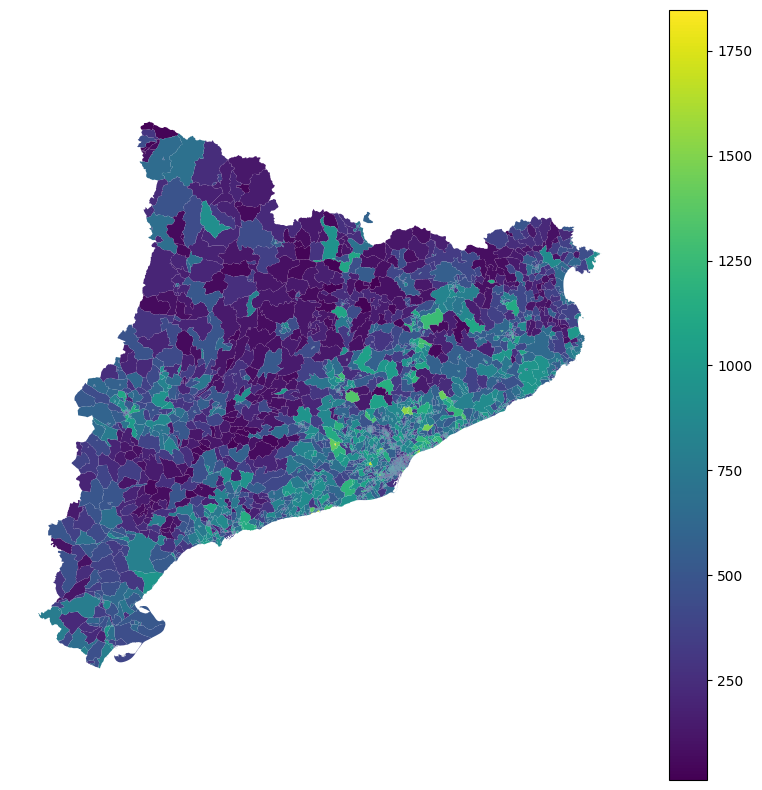

In [133]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
final_aggregated_geo.plot(column='vots', ax=ax, legend=True)
plt.axis("off")
plt.show()


In [134]:
final_aggregated_geo['party_color'] = final_aggregated_geo['party_color'].replace(np.nan, '#808080')

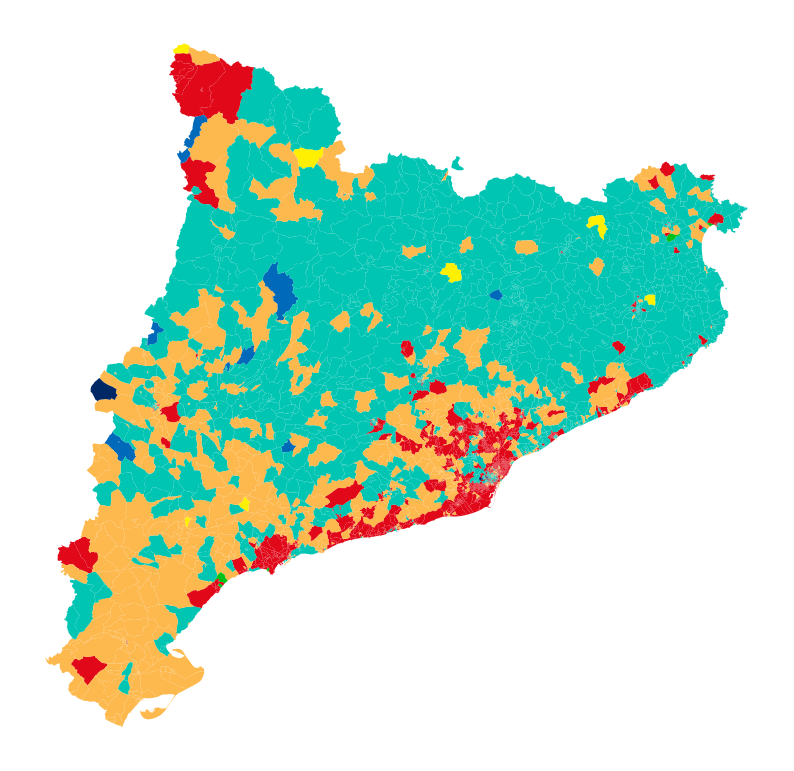

In [135]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
final_aggregated_geo.plot(
    ax=ax, color=final_aggregated_geo["party_color"]
)
plt.axis("off")
plt.show()

## Spatial Autocorrelation

In [136]:
# Generate W from the GeoDataFrame
w = weights.KNN.from_dataframe(final_aggregated_geo, k=8)
# Row-standardization
w.transform = "R"

In [137]:
final_aggregated_geo['vots_lag'] = weights.spatial_lag.lag_spatial(
    w, final_aggregated_geo['vots']
)

In [138]:
final_aggregated_geo[['vots_lag', 'vots']]

,vots_lag,vots
0,764.125,607
1,678.125,653
2,792.750,378
3,749.000,808
4,694.125,660
...,...,...
5068,556.000,529
5069,324.625,556
5070,317.875,511
5071,336.125,457


## Check output data

In [139]:
output_data = gpd.read_file("../../data/output/merged_data.geojson")

In [140]:
output_data.head()

,MUNICIPI,DISTRICTE,SECCIO,MUNDISSEC,cens_electoral_percentage_4_A19801,cens_electoral_percentage_4_A19841,cens_electoral_percentage_4_E19871,cens_electoral_percentage_4_E19891,cens_electoral_percentage_4_E20041,cens_electoral_percentage_4_G19771,...,vots_valids_percentage_999999999_M19871,vots_valids_percentage_999999999_M19911,vots_valids_percentage_999999999_M19951,vots_valids_percentage_999999999_M19991,vots_valids_percentage_999999999_M20031,vots_valids_percentage_999999999_M20071,vots_valids_percentage_999999999_M20111,vots_valids_percentage_999999999_M20151,vots_valids_percentage_999999999_M20191,geometry
0,080018,01,001,08001801001,16.898349,8.600000,0.840336,0.772400,0.084175,14.143646,...,9.62963,0.0,0.0,5.921053,0.0,0.0,3.206997,12.598791,13.577023,"POLYGON ((408792.512 4596753.053, 408797.803 4..."
1,080018,01,002,08001801002,0.000000,6.558642,0.925926,0.668648,0.000000,0.000000,...,9.66908,0.0,0.0,4.178020,0.0,0.0,4.210526,13.982860,11.019930,"POLYGON ((408265.107 4597223.944, 408314.501 4..."
2,080018,01,003,08001801003,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.00000,0.0,0.0,13.963964,0.0,0.0,3.516820,12.434692,8.695652,"POLYGON ((409117.362 4598172.550, 409152.489 4..."
3,080018,01,004,08001801004,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.00000,0.0,0.0,3.508772,0.0,0.0,2.241848,11.373578,10.777778,"POLYGON ((408670.544 4598076.591, 408718.938 4..."
4,080018,01,005,08001801005,0.000000,0.000000,0.000000,0.000000,0.068729,0.000000,...,0.00000,0.0,0.0,8.643617,0.0,0.0,3.773585,12.807676,7.623318,"POLYGON ((408075.992 4597102.922, 408093.732 4..."


In [141]:
output_data.shape

(5083, 1393)

In [142]:
output_data.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 5083 entries, 0 to 5082
Columns: 1393 entries, MUNICIPI to geometry
dtypes: float64(1388), geometry(1), object(4)
memory usage: 54.0+ MB


In [143]:
print("Number of unique values in each column:")
output_data.nunique()

Number of unique values in each column:


MUNICIPI                                    947
DISTRICTE                                    10
SECCIO                                      181
MUNDISSEC                                  5083
cens_electoral_percentage_4_A19801         2650
                                           ... 
vots_valids_percentage_999999999_M20071    1326
vots_valids_percentage_999999999_M20111    3659
vots_valids_percentage_999999999_M20151    4132
vots_valids_percentage_999999999_M20191    3865
geometry                                   5083
Length: 1393, dtype: int64

<Axes: >

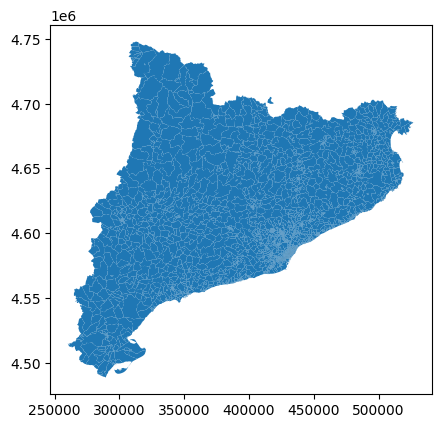

In [144]:
output_data.plot()